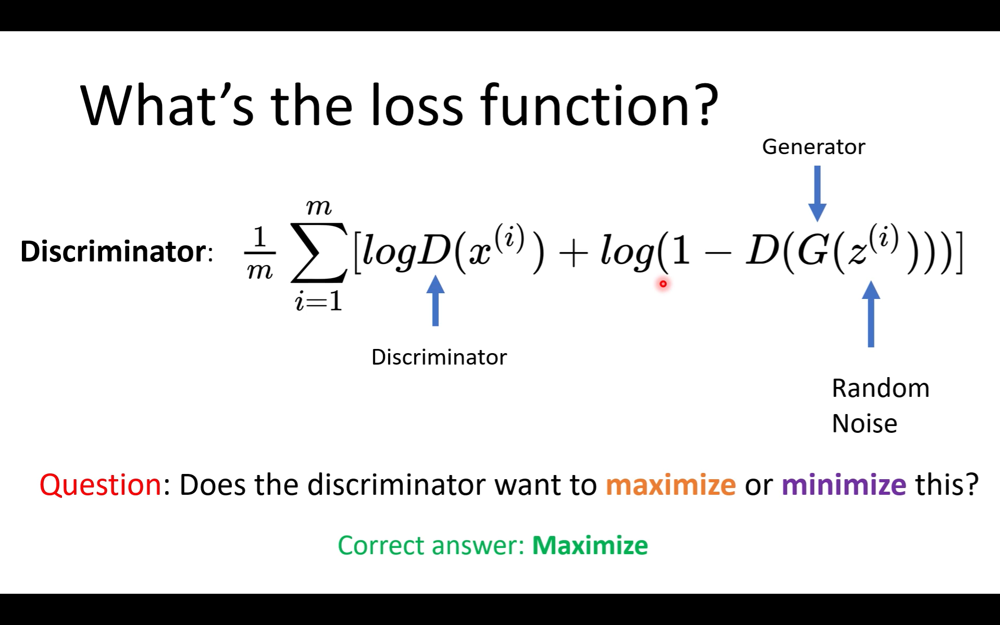

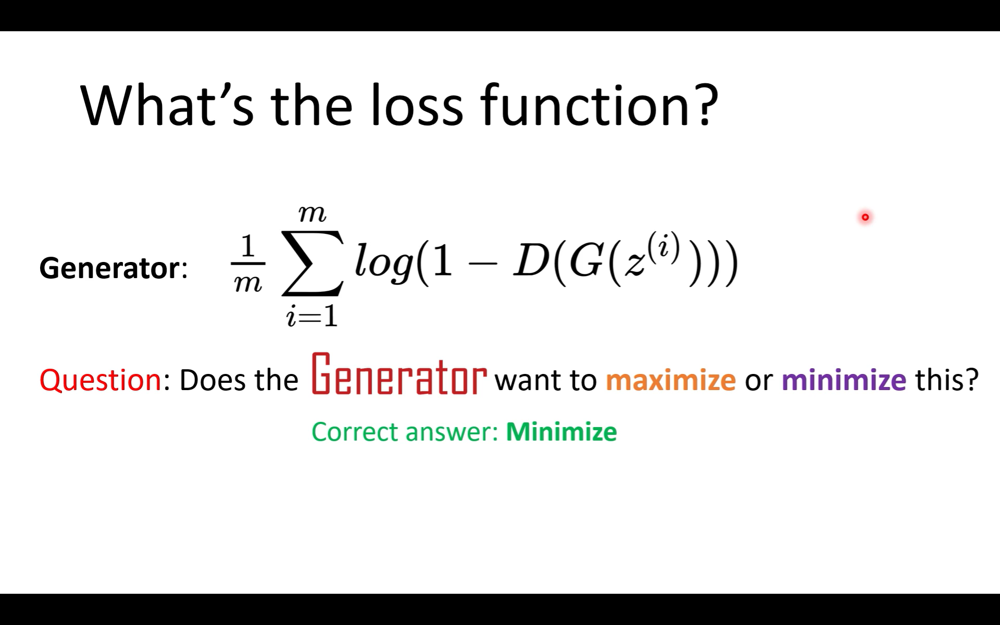

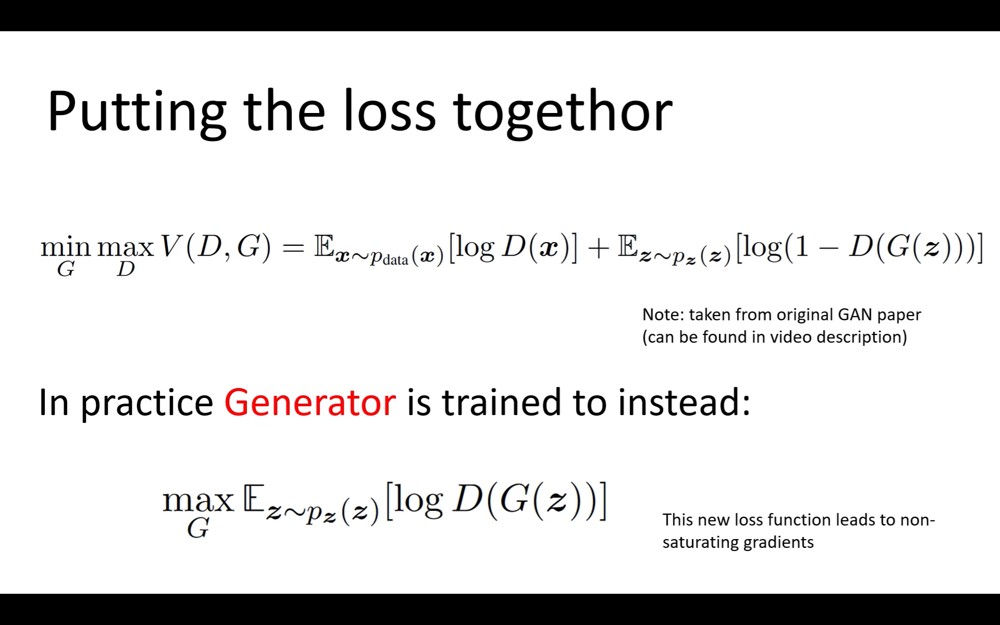

In [1]:
import torch
import torch.nn as nn
import torchvision
from torch.utils.tensorboard import SummaryWriter

In [2]:
class Discriminator(nn.Module):
  def __init__(self, img_dim):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        nn.Linear(img_dim, 128),
        nn.LeakyReLU(0.1),
        nn.Linear(128, 1),
        nn.Sigmoid(),
    )

  def forward(self, x):
    return self.disc(x)

In [3]:
class Generator(nn.Module):
  def __init__(self, z_dim, img_dim):
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        nn.Linear(z_dim, 256),
        nn.LeakyReLU(0.1),
        nn.Linear(256, img_dim),
        nn.Tanh(),
    )

  def forward(self, x):
    return self.gen(x)

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 3e-4
num_epochs = 50
z_dim = 64
img_dim = 784
batch_size = 32
step = 0

In [5]:
disc = Discriminator(img_dim).to(device)
gen = Generator(z_dim, img_dim).to(device)

In [6]:
fixed_noise = torch.randn((batch_size, z_dim)).to(device)

In [7]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5,), (0.5,)),
])
dataset = torchvision.datasets.MNIST(root='/content/dataset', transform=transforms, download=True)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 12.8MB/s]


Extracting /content/dataset/MNIST/raw/train-images-idx3-ubyte.gz to /content/dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 351kB/s]


Extracting /content/dataset/MNIST/raw/train-labels-idx1-ubyte.gz to /content/dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 3.19MB/s]


Extracting /content/dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to /content/dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 2.68MB/s]

Extracting /content/dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to /content/dataset/MNIST/raw



In [8]:
disc_optim = torch.optim.Adam(disc.parameters(), lr=lr)
gen_optim = torch.optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()
writer_fake = SummaryWriter('/content/logs/fake')
writer_real = SummaryWriter('/content/logs/real')

In [9]:
for epoch in range(num_epochs):
  running_loss_disc = 0.0
  running_loss_gen = 0.0
  count = 0
  for real, _ in dataloader:
    real = real.view(-1, 784).to(device)
    noise = torch.randn((batch_size, z_dim)).to(device)

    # Training Discriminator: max log(D(real)) + log(1 - D(fake))
    fake0 = gen(noise)
    disc_real = disc(real).view(-1)
    disc_fake = disc(fake0).view(-1)
    loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
    loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    loss_disc = (loss_disc_real + loss_disc_fake) / 2
    disc.zero_grad()
    loss_disc.backward()
    disc_optim.step()

    # Train Generator min log(1 - D(fake)) <--> max log(D(fake))
    fake1 = gen(noise)
    output = disc(fake1)
    loss_gen = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    loss_gen.backward()
    gen_optim.step()

    running_loss_disc += loss_disc.item()
    running_loss_gen += loss_gen.item()
    count += 1

    if count == 1:
      with torch.no_grad():
        fake = gen(fixed_noise).reshape(-1, 1, 28, 28)
        data = real.reshape(-1, 1, 28, 28)
        img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
        img_grid_real = torchvision.utils.make_grid(data, normalize=True)
        writer_fake.add_image("Mnist Fake Images", img_grid_fake, global_step=step)
        writer_real.add_image("Mnist Real Images", img_grid_real, global_step=step)
        step += 1

  print(f'{epoch+1}/{num_epochs}: Discriminator Loss: {running_loss_disc/count:.4f} Generator Loss: {running_loss_gen/count:.4f}')

1/50: Discriminator Loss: 0.4612 Generator Loss: 1.1660
2/50: Discriminator Loss: 0.5348 Generator Loss: 1.1066
3/50: Discriminator Loss: 0.5674 Generator Loss: 1.0728
4/50: Discriminator Loss: 0.6210 Generator Loss: 0.9623
5/50: Discriminator Loss: 0.6284 Generator Loss: 0.9741
6/50: Discriminator Loss: 0.5915 Generator Loss: 1.0795
7/50: Discriminator Loss: 0.6724 Generator Loss: 0.9495
8/50: Discriminator Loss: 0.5967 Generator Loss: 1.0868
9/50: Discriminator Loss: 0.5891 Generator Loss: 1.0983
10/50: Discriminator Loss: 0.6093 Generator Loss: 1.1470
11/50: Discriminator Loss: 0.6251 Generator Loss: 1.1340
12/50: Discriminator Loss: 0.6263 Generator Loss: 1.0570
13/50: Discriminator Loss: 0.6184 Generator Loss: 1.0621
14/50: Discriminator Loss: 0.6672 Generator Loss: 1.0128
15/50: Discriminator Loss: 0.6481 Generator Loss: 1.0246
16/50: Discriminator Loss: 0.6455 Generator Loss: 1.0360
17/50: Discriminator Loss: 0.6739 Generator Loss: 0.9939
18/50: Discriminator Loss: 0.6277 Genera

In [12]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [16]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>